
#  <span style="color:blue">Overview  </span>
#### <span style="color:blue">1) Presettings </span>
#### <span style="color:blue">2) Visualisation of Raw Data </span>
#### <span style="color:blue">3) Data Preprocessing </span>
- Most frequent words 

      - Bar Chart                   [done]
        
      - Pie Chart                   [done]
        
      - Word Cloud                  [done]
        
      - Heat Map                    [ToDo]
      
- Split total messages

- Creating Embedding Matrix from data 

      - BoW                         [done]
    
      - Word2Vec                    [ongoing]
    
      - BERT                        [ToDo]
      

#### <span style="color:blue">4) Building and evaluating models </span>
    - Logistic Regression             [done]


    - Naive Bayes MultinomialNB       [done]


    - Support Vector Machine          [done]
    
    
    - Random Forest                   [done]


    - Deep Neural Networks            [ToDo]


    - Convolutional Neural Networks   [ToDo]


    - Recurrent Neural Networks       [ToDo]




#### <span style="color:blue">5) Comparing models </span>
#### <span style="color:blue">6) Model optimization  </span>

#### Further steps [ToDo]
###### - Automatic Hyperparametervariation - XWA-05.11.21
###### - Building pipelines from data preprocessing - XWA-06.11.21
###### - Word2Vec via tok2 -XWA-03.11.21
###### - BERT - XWA-03-11-2021
###### - Word2Vec via tok2 -XWA-03.11.21

 # <span style="color:blue">1)  Presettings </span>

In [31]:
# Step 1
nltk.download('all') 

## -------- Further steps in Anaconda Prompt --------

## Step 2
## NOTE: update your gensim for Word2Vec functionality via Anaconda Prompt
## conda install gensim

## Step 3
## NOTE: install wordcloud for display functionality via Anaconda Prompt
## conda install -c conda-forge wordcloud

## Step 4
## NOTE: install tensorflow version 2.3.0 via Anaconda Prompt
## conda install -c conda-forge tensorflow tensorflow==2.3.0


## Step 5
## NOTE: install keras via Anaconda Prompt
## conda install -c conda-forge keras

## Step 6
## NOTE: install plotly via Anaconda Prompt
## pip install plotly

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package biocreative_ppi is already up-to-date!
[nltk_data]    | Downloading package brown to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package brown_tei to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package brown_tei is already up-to-date!
[nltk_data]    | Downloading package cess_cat to
[nltk_data]    |     C:\Users\x

[nltk_data]    |   Package rte is already up-to-date!
[nltk_data]    | Downloading package semcor to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package semcor is already up-to-date!
[nltk_data]    | Downloading package senseval to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package senseval is already up-to-date!
[nltk_data]    | Downloading package sentiwordnet to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package sentiwordnet is already up-to-date!
[nltk_data]    | Downloading package sentence_polarity to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package sentence_polarity is already up-to-date!
[nltk_data]    | Downloading package shakespeare to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package shakespeare is already up-to-date!
[nltk_data]    | Downloading package sinica_treebank 

[nltk_data]    |   Package nonbreaking_prefixes is already up-to-date!
[nltk_data]    | Downloading package vader_lexicon to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package vader_lexicon is already up-to-date!
[nltk_data]    | Downloading package porter_test to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package porter_test is already up-to-date!
[nltk_data]    | Downloading package wmt15_eval to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package wmt15_eval is already up-to-date!
[nltk_data]    | Downloading package mwa_ppdb to
[nltk_data]    |     C:\Users\xiaow\AppData\Roaming\nltk_data...
[nltk_data]    |   Package mwa_ppdb is already up-to-date!
[nltk_data]    | 
[nltk_data]  Done downloading collection all


True

In [32]:
#### Import libs and tools 
import pandas as pd
import numpy as np
import string
import nltk # https://www.nltk.org/howto/corpus.html
import tensorflow as tf # version 2.3.0
import matplotlib.pyplot as plt
import gensim

from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords

from sklearn import svm
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_extraction.text import CountVectorizer # Bag of Words (BOW)
from sklearn import metrics
from sklearn.metrics import plot_confusion_matrix, plot_roc_curve, RocCurveDisplay
from sklearn.metrics import matthews_corrcoef # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.matthews_corrcoef.html
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score, ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier


from tensorflow import keras
from tensorflow.keras.preprocessing.text import Tokenizer # equal to CountVectorizer. Usage: tokenizer = Tokenizer(num_words=my_max) --> tokenizer.fit_on_texts(text) 
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import layers, losses, preprocessing
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization
from tensorflow.keras.layers import (Embedding , Flatten , Dense ,LSTM , Bidirectional , MaxPooling1D , 
Conv1D , GlobalMaxPool1D , BatchNormalization, Dropout , GRU)

from keras import layers # Keras version 2.2.4
from keras.preprocessing.text import text_to_word_sequence # no comma "," and punktuation"." etc.

from wordcloud import WordCloud
from gensim.models import Word2Vec
from mpl_toolkits import mplot3d
import seaborn as sns
from plotly import graph_objs as go
import plotly.express as px





In [33]:
#### Setup data display params
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

#### Declare variables for target vector in embedding matrix via BoW 
ytrain_bow = list()
ytest_bow = list()

#### Declare target_class for target vector in embedding matrix via BoW
msg = {'ham': 0,'spam': 1}

#### Declare train and test param for vectorisation via Word2Vec
xtrain_w2v = ()
ytrain_w2v = ()
xtest_w2v = ()
ytest_w2v = ()

#### Declare variables for Keras (tok1) and NLTK (tok2) Tokenizer via Word2vec
message_tok1 = list()
message_tok2 = list()



In [34]:
## load the data file   
df = pd.read_csv("data/Dataset_SMS Spam Collection.txt", sep="\t", header=None)

## Assign data to label- and message heading
df.columns = ['label', 'message']

df

,label,message
0,ham,"Go until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 08452810075over18's
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives around here though"
5,spam,"FreeMsg Hey there darling it's been 3 week's now and no word back! I'd like some fun you up for it still? Tb ok! XxX std chgs to send, £1.50 to rcv"
6,ham,Even my brother is not like to speak with me. They treat me like aids patent.
7,ham,As per your request 'Melle Melle (Oru Minnaminunginte Nurungu Vettam)' has been set as your callertune for all Callers. Press *9 to copy your friends Callertune
8,spam,WINNER!! As a valued network customer you have been selected to receivea £900 prize reward! To claim call 09061701461. Claim code KL341. Valid 12 hours only.
9,spam,Had your mobile 11 months or more? U R entitled to Update to the latest colour mobiles with camera for Free! Call The Mobile Update Co FREE on 08002986030


# <span style="color:blue"> 2) Visualisation of Raw Data </span>
####  Create frequency word cloud [done] 

---
for more information see https://www.python-lernen.de/wordcloud-erstellen-python.htm

# Emulate Characteristic of Word Cloud
#### Example 1 - Word Cloud without stopwords
#### Example 2 - Most frequent words 

---
for more information see https://amueller.github.io/word_cloud/generated/wordcloud.WordCloud.html

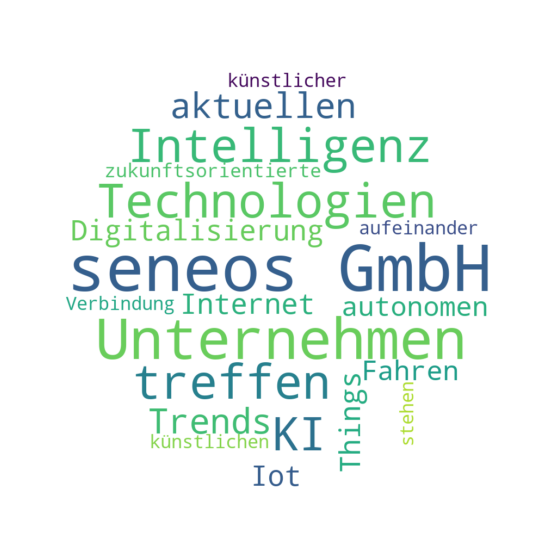

<Figure size 2400x1600 with 0 Axes>

In [35]:
###################################
## NOTE: This is an example      ##
## Word Cloud without stopwords  ##
###################################

## Rescale Plot
plt.rcParams['figure.figsize'] = [12, 10]

#### Create frequency word cloud - Example 
text = """Bei den aktuellen Trends zu Digitalisierung, Internet of Things (Iot) und autonomen Fahren, treffen zukunftsorientierte Technologien aufeinander, welche mit künstlicher Intelligenz in Verbindung stehen.
Technologien mit künstlichen neuronalen Netzen ermöglichen intelligente, selbstlernende und echtzeitfähige IT-Systeme, welche auf Basis von gesammelten Daten in der Lage sind, eigenständige Entscheidungen zu treffen.
Ein Ziel der seneos GmbH ist, die vorhandenen Prozesse und Arbeitsabläufe in Ihrem Unternehmen zu analysieren und gemeinsam mit Ihnen die Verbesserungspotentiale aufzuzeigen, so dass eine Optimierung und Automatisierung zu einem Mehrwert Ihres Unternehmens entstehen kann.
Die seneos GmbH setzt die künstliche Intelligenz (KI) als Assistenzfunktion ein, um Performance und Effizienz in eines seiner Kerngeschäftsfelder, dem Requirement Engineering, zu optimieren.
Das KI Team der seneos GmbH entwickelt Assistenz- und Automatisierungstools, um den Arbeitsaufwand innerhalb eines Unternehmens zu minimieren. Dies führt zu einer Kostenreduktion, Zeiteinsparung und Qualitätssicherung der Arbeit durch automatisierte Kontrolle von Arbeitsergebnissen.
Das Expertenteam der seneos GmbH steht ihnen für Beratung und Umsetzung kompetent zur Seite. 
Die folgenden fünf Schritte verdeutlichen den Ablauf und wie der Erfolg sichergestellt wird:"""
## Remove stop words
stop_words = set(stopwords.words('german'))

## Tokenize and convert filtered_sentence list to string
word_tokens = word_tokenize(text)
filtered_sentence_example = [w for w in word_tokens if not w.lower() in stop_words]
filtered_text_example = ' '.join([str(item) for item in filtered_sentence_example])

# Generate a word cloud image
x, y = np.ogrid[:1000, :1000]

mask = (x - 500) ** 2 + (y - 500) ** 2 > 400 ** 2
mask = 255 * mask.astype(int)

wordcloud = WordCloud(background_color="white",max_font_size=200,max_words=20,width=2000, height=2000,mask=mask).generate(filtered_text_example)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.figure(figsize=(12,8), dpi= 200, facecolor='w', edgecolor='k')
plt.show()


In [36]:
#################################
## NOTE: This is an example    ##
## Word Cloud frequent words   ##
#################################

## Rescale Plot
plt.rcParams['figure.figsize'] = [16, 10]

#### Create frequency word cloud - Example (Source:https://www.porsche.com/germany/aboutporsche/pressreleases/germany/?pool=germany&id=667212)
text = """Weissach . Porsche nutzt Künstliche Intelligenz (KI) in der Fahrzeugentwicklung,
          um Antriebe noch effizienter und nachhaltiger zu gestalten sowie Entwicklungsprozesse
          weiter zu optimieren. KI verleiht Computern die Fähigkeit, Probleme zu analysieren 
          und sie automatisiert zu lösen – ähnlich wie ein Mensch. Dieses Potenzial wird bei 
          der Antriebsentwicklung sowohl im Bereich E-Mobilität als auch beim Verbrennungsmotor 
          als traditionelle Maschinenbaudomäne genutzt. Prognose der Ölverschäumung Bei der 
          Entwicklung klassischer Verbrennungsmotoren löst die KI beispielsweise das Problem der 
          Prognose des Gasgehalts im Motoröl. Da hohe Gasanteile zur Ölverschäumung und damit zu 
          reduzierter Schmierfähigkeit führen, muss das Ölsystem auf einen möglichst geringen 
          Gasgehalt ausgelegt werden. Messungen sind bei laufendem Motor im Fahrzeug allerdings 
          kaum durchführbar. Ein neues KI-Verfahren von Porsche liefert nun verlässliche Prognosen 
          über den Gasgehalt im Motoröl. „Dabei konnten wir die erforderliche Rechenkapazität für 
          den KI-Algorithmus so geringhalten, dass wir ihn problemlos in den Motorentwicklungsprozess
          integrieren können“, sagt Entwicklungsingenieurin Hong Truc Jung, die bei Porsche für die 
          KI-Tools im Antrieb verantwortlich ist. „Bei den Standardprüfstandtests läuft er permanent 
          mit und liefert uns dabei die gewünschten Daten.“ Das erste Aggregat, bei dem Porsche das 
          neue KI-Verfahren angewendet hat, war der Sechszylinder-Boxermotor für den Porsche Cayman 
          GT4. Batteriezustandsanalyse bei E-Fahrzeugen Eine KI-Anwendung der Porsche-Technologietochter 
          Porsche Engineering ist die Bestimmung des Alterungsverhaltens der Lithium-Ionen-Batterie, 
          die Fahrer von E-Fahrzeugen schon heute für Prognosen über die Batteriereichweite während der 
          Fahrt nutzen. Dabei schließt der KI-Algorithmus durch den Innenwiderstand der Batterie auf ihre 
          Alterung. Er berücksichtigt unter anderem Einflüsse wie die Temperatur und den Ladezustand sowie 
          Ergebnisse von Langzeit- und Flottentests. Im Fahrzeug passt sich die KI an das Nutzerprofil des 
          Fahrers an, sodass die Vorhersage immer präziser wird. Porsche Engineering Reinforcement Learning 
          (PERL) Eine besonders flexible Entwicklungsmethodik mit hohem Potenzial für unterschiedlichste 
          Anwendungsfälle hat Porsche Engineering auf Basis der KI-Methode Deep Reinforcement Learning 
          entwickelt. „Unsere Methodik PERL, kurz für Porsche Engineering Reinforcement Learning, geht über 
          die spezifische Lösung einzelner Aufgaben hinaus, denn sie versteht systemische Zusammenhänge und 
          lernt strategisch zu entscheiden“, erklärt Matthias Bach, Leiter Fachdisziplin Motor Applikation 
          und Mechanik bei Porsche Engineering. Da die neuronalen Netze des KI-Algorithmus mehrere auch 
          miteinander gekoppelte Parameter gleichzeitig variieren und die resultierenden Auswirkungen 
          prognostizieren können, ist PERL prädestiniert für komplexe Motor-Applikationsaufgaben und viele 
          andere Entwicklungsbereiche des Fahrzeugs. „Mit PERL können wir die Entwicklungszeit reduzieren und
          dabei bessere Applikationsergebnisse erzielen, als mit konventionellen Methoden“, ergänzt Bach. 
          Derzeit befindet sich die Methode im Praxistest der Antriebsentwicklung und soll mittelfristig 
          auch in anderen Bereichen wie Gesamtfahrzeug, Fahrwerk und Elektrik/Elektronik bei Porsche 
          Engineering eingesetzt werden. """

test_freq = FreqDist()

word_tokens_example = text_to_word_sequence(text)
for word in word_tokens_example:
    test_freq[word.lower()]+=1
print("Most frequent words in total amout of messages (raw data):")
test_freq.most_common(30)




Most frequent words in total amout of messages (raw data):


[('die', 17),
 ('der', 13),
 ('und', 13),
 ('porsche', 12),
 ('ki', 12),
 ('bei', 8),
 ('im', 7),
 ('den', 7),
 ('für', 7),
 ('zu', 6),
 ('engineering', 6),
 ('das', 5),
 ('des', 5),
 ('perl', 4),
 ('in', 3),
 ('wie', 3),
 ('e', 3),
 ('als', 3),
 ('auch', 3),
 ('auf', 3),
 ('motor', 3),
 ('von', 3),
 ('über', 3),
 ('wir', 3),
 ('algorithmus', 3),
 ('ist', 3),
 ('mit', 3),
 ('dabei', 3),
 ('reinforcement', 3),
 ('learning', 3)]

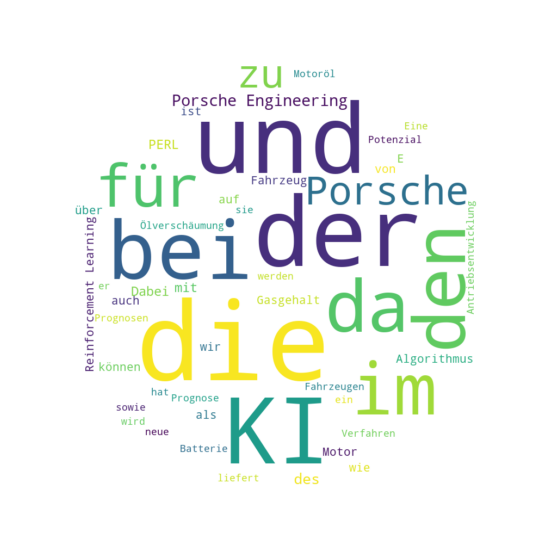

<Figure size 400x200 with 0 Axes>

In [37]:

# Generate a word cloud image
x, y = np.ogrid[:1000, :1000]

mask = (x - 500) ** 2 + (y - 500) ** 2 > 400 ** 2
mask = 255 * mask.astype(int)

wordcloud = WordCloud(background_color="white",max_font_size=200,max_words=50,width=1000, height=800,mask=mask).generate(text)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.figure(figsize=(2,1), dpi= 200, facecolor='w', edgecolor='k')
plt.show()

# Create charts to describe dataset

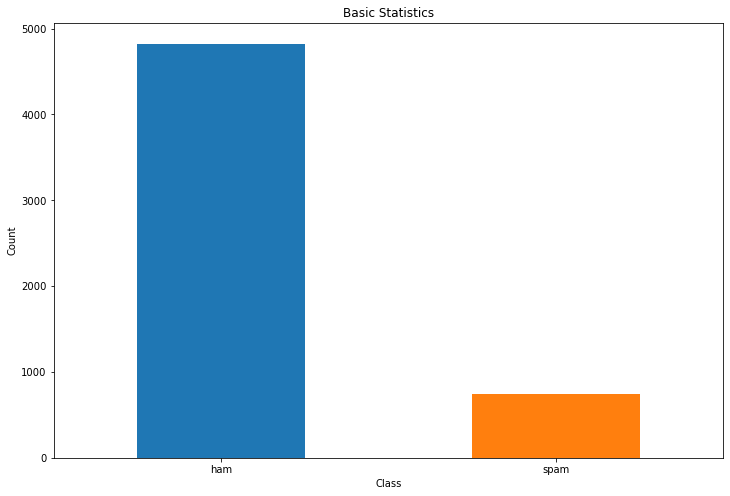

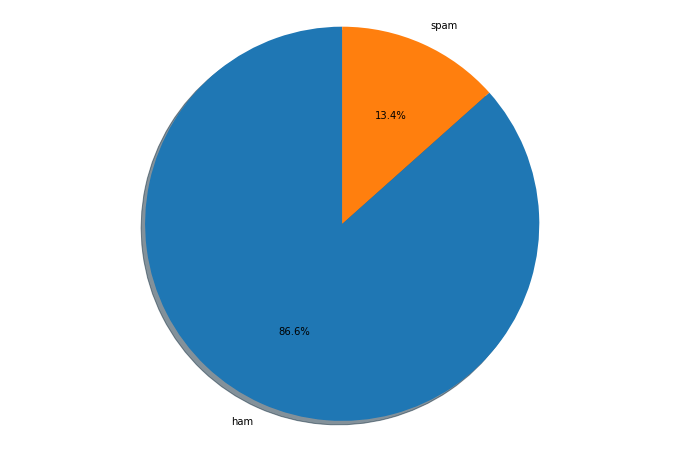

<Figure size 200x100 with 0 Axes>

In [38]:
#### Create bar chart for visualization
plt.rcParams['figure.figsize'] = [12, 8]
count_classes = df['label'].value_counts()
plt.title("Basic Statistics")
count_classes.plot.bar(color=['C0', 'C1'])

plt.xticks(rotation='horizontal')
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

#### Create pie chart for visualization
labels = 'ham', 'spam'
sizes = [count_classes[0], count_classes[1]]
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.figure(figsize=(2,1), dpi= 100)
plt.show()

# <span style="color:blue">3)  Data Preprocessing </span>

# Length of words in Ham and Spam
---
For more information see https://plotly.com/python/line-and-scatter/

In [39]:
testmsg = df.message[:3]
testmsg 

0                                                Go until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...
1                                                                                                                                  Ok lar... Joking wif u oni...
2    Free entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 08452810075over18's
Name: message, dtype: object

In [40]:
# Find max number of words sentences
print("Maximum number of words in sentence are", np.max(df.message.apply(lambda x: len(x.split())).values), "words")

Maximum number of words in sentence are 171 words


In [41]:
# Creating series with length as index
# Sorting the series by index i.e. length
df_length_ham = df[df['label']=='ham'].message.apply(lambda x: len(x.split())).value_counts().sort_index()
df_length_spam = df[df['label']=='spam'].message.apply(lambda x: len(x.split())).value_counts().sort_index()


In [42]:
# X-axis consists of the length of the msgs
# Y-axis consists of the frequency of those lengths
plt.rcParams['figure.figsize'] = [12, 8]
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df_length_ham.index, y=df_length_ham.values, 
                    mode='lines',
                    name='Ham'))
fig.add_trace(go.Scatter(x=df_length_spam.index, y=df_length_spam.values,
                    mode='lines',
                    name='Spam'))
fig.update_layout(title="Häufigkeit zu SMS in Wörtern", xaxis_title = "Anzahl der Wörter", yaxis_title ="Häufigkeit der SMS")

fig.show()

# Most frequent words in ham, spam and total messages


The number of hams, spams and total messages are extracted from the feature matrix without an index.
The FreqDist () method is used to count the most frequent words in hams, spams and total amount of messages.

In [43]:
#### Analyse most frequent words in ham, spam and total messages via NLTK
## Extract ham messages without index
df_message_ham_no_index = (df[df.label == "ham"]).message.to_string(index=False)
## Extract spam messages without index
df_message_spam_no_index = (df[df.label == "spam"]).message.to_string(index=False)
## Extract total amout of messages without index
df_message_total_no_index = df.message.to_string(index=False)

## Count word frequences in text via nltk.word_tokenize, see also chapter 3.1
fdist_total = FreqDist()
fdist_ham = FreqDist()
fdist_spam = FreqDist()

## Tokenized raw textcorpus
word_tokens_total = text_to_word_sequence(df_message_total_no_index) 
word_tokens_ham = text_to_word_sequence(df_message_ham_no_index) 
word_tokens_spam = text_to_word_sequence(df_message_spam_no_index) 



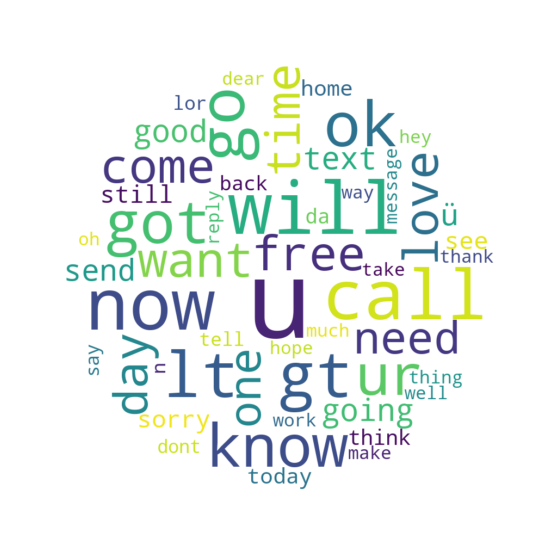

<Figure size 3600x2400 with 0 Axes>

In [44]:
## Word Plot bigger size
plt.rcParams['figure.figsize'] = [16, 10]

## WordCloud wordtokens from total dataset 
filtered_text = ' '.join([str(item) for item in word_tokens_total])

# Generate a word cloud image
x, y = np.ogrid[:1000, :1000]

mask = (x - 500) ** 2 + (y - 500) ** 2 > 400 ** 2
mask = 255 * mask.astype(int)


wordcloud = WordCloud(background_color="white",max_font_size=200,max_words=50,width=1000, height=800,mask=mask).generate(filtered_text)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.figure(figsize=(12,8), dpi= 300, facecolor='w', edgecolor='k')
plt.show()

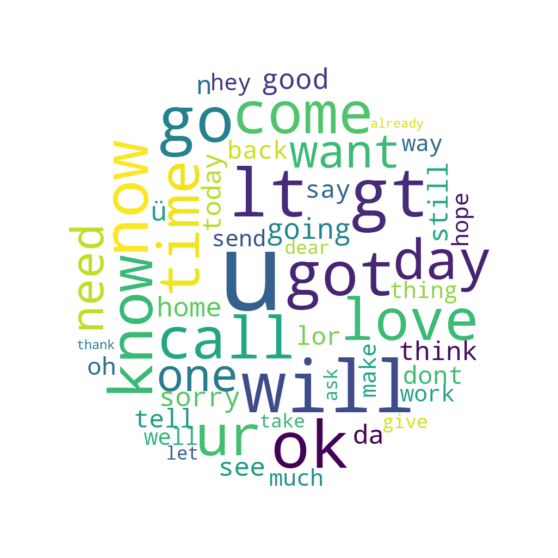

<Figure size 4800x3000 with 0 Axes>

In [45]:
## Word Plot bigger size
plt.rcParams['figure.figsize'] = [16, 10]

## WordCloud wordtokens in hams 
filtered_text = ' '.join([str(item) for item in word_tokens_ham])

# Generate a word cloud image
x, y = np.ogrid[:1000, :1000]

mask = (x - 500) ** 2 + (y - 500) ** 2 > 400 ** 2
mask = 255 * mask.astype(int)

wordcloud = WordCloud(background_color="white",max_font_size=200,max_words=50,width=2000, height=1600,mask=mask).generate(filtered_text)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.figure(figsize=(16,10), dpi= 300, facecolor='w', edgecolor='k')
plt.show()

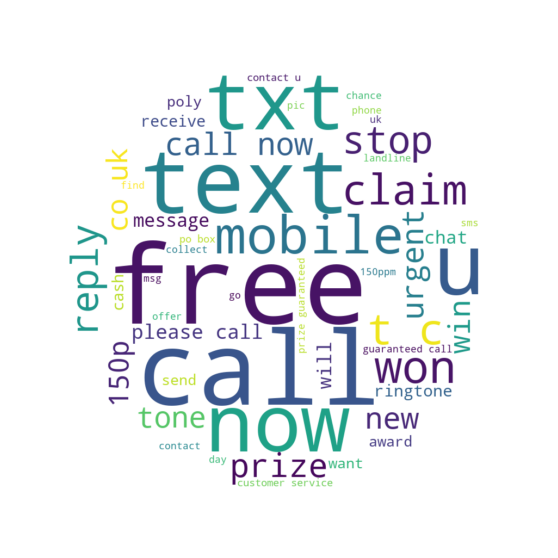

<Figure size 3000x1500 with 0 Axes>

In [46]:
## Word Plot bigger size
plt.rcParams['figure.figsize'] = [16, 10]

## WordCloud with most 20 frequent words in spams 
filtered_text = ' '.join([str(item) for item in word_tokens_spam])

# Generate a word cloud image
x, y = np.ogrid[:1000, :1000]

mask = (x - 500) ** 2 + (y - 500) ** 2 > 400 ** 2
mask = 255 * mask.astype(int)

wordcloud = WordCloud(background_color="white",max_font_size=200,max_words=50,width=2000, height=800,mask=mask).generate(filtered_text)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.figure(figsize=(10,5), dpi= 300, facecolor='w', edgecolor='k')
plt.show()

# Split total messages for training 70 train to 30 test for BoW


In [47]:
## Splitting total messages 
xtrain,xtest,ytrain,ytest = train_test_split(df.message,df.label,random_state=3,test_size=0.30)
print("Amount of samples for training: ", len(xtrain))
print("Amount of samples for testing:  ", len(xtest))
print("---------------------------------")
print("Total amount of data:           ", len(df.message))

Amount of samples for training:  3900
Amount of samples for testing:   1672
---------------------------------
Total amount of data:            5572


# Creating Embedding Matrix from data
### Bag of Words (BoW) [done]
- Tokenize the text
- Identify unique words
- Count the occurrence of each unique word in the text

### Word2Vec [ongoing]


### Bag of Words (BoW) via sklearn CountVecotrizer [done]
- lowercases your text (set lowercase=false if you don’t want lowercasing)
- uses utf-8 encoding
- performs tokenization (converts raw text to smaller units of text)
- uses word level tokenization (meaning each word is treated as a separate token)
--- 
for more information see https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

In [48]:
#### BoW with CountVectorizer (cv) from Scikit Learn

## Create instance from cv 
cv = CountVectorizer()

## Fit phrases to create vocabulary while fitting. Vocabulary includes assignment of words to unique identifier for train- and testdata 
cv.fit(df.message)

## Display size of vocabulary and dictionary
print("Vocabulary size: {}".format(len(cv.vocabulary_)))
print("Sample per class: {}".format((cv.vocabulary_)))



Vocabulary size: 8713
Sample per class: {'go': 3571, 'until': 8084, 'jurong': 4374, 'point': 5958, 'crazy': 2338, 'available': 1316, 'only': 5571, 'in': 4114, 'bugis': 1767, 'great': 3655, 'world': 8548, 'la': 4501, 'buffet': 1765, 'cine': 2061, 'there': 7694, 'got': 3615, 'amore': 1082, 'wat': 8324, 'ok': 5538, 'lar': 4537, 'joking': 4342, 'wif': 8450, 'oni': 5567, 'free': 3373, 'entry': 2963, 'wkly': 8506, 'comp': 2178, 'to': 7806, 'win': 8463, 'fa': 3100, 'cup': 2398, 'final': 3221, 'tkts': 7793, '21st': 412, 'may': 4959, '2005': 403, 'text': 7644, '87121': 794, 'receive': 6340, 'question': 6232, 'std': 7279, 'txt': 7986, 'rate': 6284, 'apply': 1169, '08452810075over18': 77, 'dun': 2815, 'say': 6679, 'so': 7074, 'early': 2836, 'hor': 3952, 'already': 1054, 'then': 7688, 'nah': 5270, 'don': 2724, 'think': 7709, 'he': 3805, 'goes': 3579, 'usf': 8130, 'lives': 4692, 'around': 1220, 'here': 3856, 'though': 7729, 'freemsg': 3380, 'hey': 3866, 'darling': 2455, 'it': 4245, 'been': 1475, 'w

#### Create embedding matrix via BoW

In [49]:
## Transfer splitted data messages in order to create BoW for train- and testset
xtrain_bow = cv.transform(xtrain)
xtest_bow = cv.transform(xtest)

## Create feature matrix from BoW
xtrain = xtrain_bow.toarray()
xtest = xtest_bow.toarray()

## Create binary target vector for ham = 0 and spam = 1
ytrain = [msg[item] for item in ytrain]
ytest = [msg[item] for item in ytest]

In [50]:
## Display amount of hams in train dataset
print("Amount of hams in train dataset:\t", ytrain.count(0))
## Display amount of spams in train dataset
print("Amount of spams in train dataset:\t ", ytrain.count(1))
print("---------------------------------")
print("Total amount hams + spams in train:\t", len(ytrain), "\n\n")

## Display amount of hams in test dataset
print("Amount of hams in test dataset:\t\t", ytest.count(0))
## Display amount of spams in test dataset
print("Amount of spams in test dataset:\t ", ytest.count(1))
print("---------------------------------")
print("Total amount hams + spams in test:\t", len(ytest), "\n\n")

Amount of hams in train dataset:	 3385
Amount of spams in train dataset:	  515
---------------------------------
Total amount hams + spams in train:	 3900 


Amount of hams in test dataset:		 1440
Amount of spams in test dataset:	  232
---------------------------------
Total amount hams + spams in test:	 1672 




### Create embedding matrix via Word2Vec & NLTK

#### Word2vec Architecture
Word2Vec [1][2] can be used with two word representation methods, Continuous Bag of words (CBOW) or Skip-Gram architecture, to convert unsupervised representation to supervised structure for further processing e.g. training of deep learning models.
CBOW or Skip-Gram option can selected during training of Word2Vec model.

#### CBOW
In CBOW, a sliding window covers the sorrounding context sequence of the current word w_i. By given sequence w_i-1,w_i-2, w_i+1, w_i+2, the model provides current word w_i.

#### Skip-Gram
Skip-Gram performs opposite of CBOW.
By given current word w_i, Skip-Gram predicts the context or wi-1, wi-2, wi+1, wi+2.

---

[1] Mikolov, Tomas et al. “Efficient Estimation of Word Representations in Vector Space.” ICLR (2013).

[2] Goldberg, Y. and Omer Levy. “word2vec Explained: deriving Mikolov et al.'s negative-sampling word-embedding method.” ArXiv abs/1402.3722 (2014): n. pag.

### Selecting Tokenizer - NKTK vs. Keras

Data pattern includes relatively short messages (limited to 140 bytes) with idioms and abbreviations [1]. word_tokenizer (NLTK) and text_to_word_sequence (Keras) Tokenizer is used for analyzing the results with Word2Vec . 

---

[1] Almeida, T.A., Gómez Hidalgo, J.M., Yamakami, A. Contributions to the study of SMS Spam Filtering: New Collection and Results. Proceedings of the 2011 ACM Symposium on D

In [51]:
###############################
## NOTE: This is an example  ##
## Keras vs NLTK Tokenizer   ##
###############################

# Define example text
text = "A Fox Jumped Over TH3 L4zy-D0g with Nr.636141112. E-mail: =%)&(apple/my's !0y@gmail.com ? "

# tokenize the document with keras function (tok1)
print("tok1 :\t",text_to_word_sequence(text), "\n")

# tokenize the document with nltk function (tok2)
print("tok2 :\t", word_tokenize(text))

tok1 :	 ['a', 'fox', 'jumped', 'over', 'th3', 'l4zy', 'd0g', 'with', 'nr', '636141112', 'e', 'mail', 'apple', "my's", '0y', 'gmail', 'com'] 

tok2 :	 ['A', 'Fox', 'Jumped', 'Over', 'TH3', 'L4zy-D0g', 'with', 'Nr.636141112', '.', 'E-mail', ':', '=', '%', ')', '&', '(', 'apple/my', "'s", '!', '0y', '@', 'gmail.com', '?']


### Tokenization via tok1 (Keras) [done] and tok2 (NLTK) [ToDo]: Word2Vec via tok2 -XWA-03.11.21



In [52]:
## Tokenization of total message
message_tok1=list()
message_tok2=list()
for i in df.message: 
    ## tok1 - Keras
    message_tok1.append(text_to_word_sequence(i)) 
    ## tok2 - NLTK [ToDo]: Create Tokenization on train and test data
    message_tok2.append(word_tokenize(i))
    
## Use tokenized Messages for Word2Vec (used tok2 here)
msg_tok = message_tok1

In [53]:
## Create instance of Word2Vec

w2v_model = Word2Vec(msg_tok, vector_size=100, window=5, min_count=2, workers=4)
# min_count (int, optional) – Ignores all words with total frequency lower than this.
# workers (int, optional) – Use these many worker threads to train the model (=faster training with multicore machines).
# window (int, optional) – Maximum distance between the current and predicted word within a sentence.
# vector_size (int, optional) – Dimensionality of the word vectors.
print("Amount of words with embeddings: ", len(w2v_model.wv))

## Save the model 
w2v_model.save("word2vec.model")

w2v_model = Word2Vec.load("word2vec.model")

w2v_model.train([["hello", "world"]], total_examples=1, epochs=1)

Amount of words with embeddings:  4435


(2, 2)

In [54]:
vector = w2v_model.wv['call'] 
print(vector)

[-0.29952997  0.6798442   0.01083936 -0.18795232  0.05134076 -1.1972231
  0.34734753  1.4997864  -0.31807396 -0.6547133  -0.3996337  -1.1457897
 -0.03515598  0.45428333  0.27853844 -0.6519404   0.07163598 -0.49718985
  0.1751891  -1.3923508   0.46321586  0.16009359  0.45368382 -0.37057835
 -0.3873681  -0.00579031 -0.4442729  -0.4978872  -0.64863807  0.12243907
  0.69418144 -0.03750354  0.30603054 -0.72193485 -0.18724738  1.0014012
  0.14972435 -0.6132887  -0.3161154  -1.274974   -0.00239294 -0.38059863
 -0.2229651   0.22051483  0.64440686 -0.4091389  -0.37061325 -0.2675748
  0.5856086   0.30024192  0.4336834  -0.5152778   0.0044535   0.08382287
 -0.3478454   0.29077047  0.248436   -0.02390156 -0.55851763  0.16082746
  0.23245351 -0.00453789 -0.28006798 -0.11263429 -0.97556305  0.76608187
  0.26352987  0.46140286 -0.82696444  0.79147035 -0.51853025  0.48084712
  0.9197898   0.08650798  0.5932537   0.24793297 -0.01466693 -0.10069049
 -0.7810506   0.12670983 -0.5294789   0.26490557 -0.832

In [55]:
w2v_model.wv.most_similar('call', topn=10)

[('claim', 0.9985072016716003),
 ('prize', 0.9983473420143127),
 ('free', 0.9979549646377563),
 ('landline', 0.9979289174079895),
 ('guaranteed', 0.9979041814804077),
 ('text', 0.9976552724838257),
 ('reply', 0.9976215362548828),
 ('from', 0.9976187348365784),
 ('txt', 0.9974772334098816),
 ('now', 0.9974129796028137)]

# Split total messages for training 70 train to 30 test for Word2Vec


In [56]:
## Splitting total messages for Word2Vec
xtrain_wv, xtest_wv, ytrain_wv, ytest_wv = train_test_split(msg_tok,df.label,random_state=3,test_size=0.30)
print("Amount of samples for training: ", len(xtrain_wv))
print("Amount of samples for testing:  ", len(xtest_wv))
print("---------------------------------")
print("Total amount of data:           ", len(df.message))

Amount of samples for training:  3900
Amount of samples for testing:   1672
---------------------------------
Total amount of data:            5572


# <span style="color:blue"> 4) Building and evaluating models </span>

### Logistic Regression

In [57]:
## Build Logistic Regression Model
logreg = LogisticRegression()
logreg.fit(xtrain, ytrain)
print("Training set acc score: {:.4f}".format(logreg.score(xtrain, ytrain)))
print("Test set acc score: {:.4f}".format(logreg.score(xtest, ytest)))


Training set acc score: 0.9972
Test set acc score: 0.9803


Confusion matrix: 
[[1434    6]
 [  27  205]]


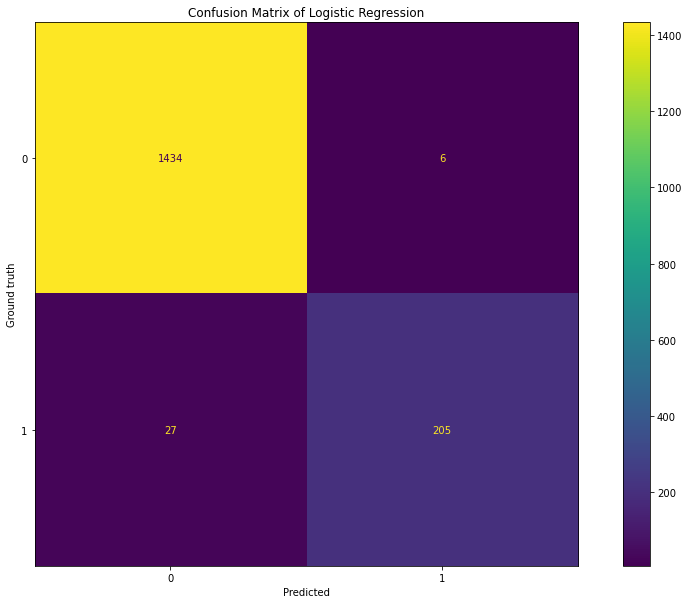

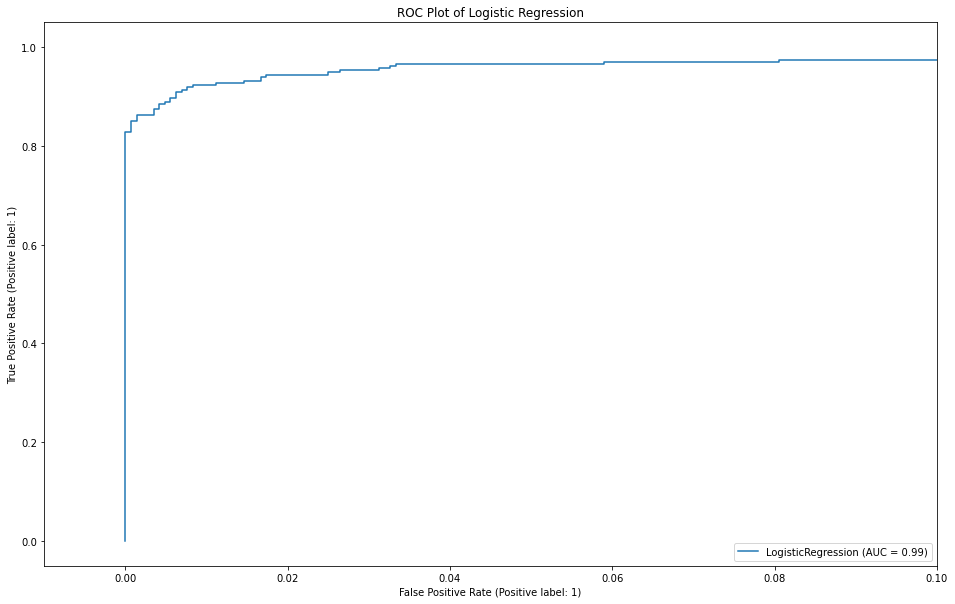

In [58]:
## Predict on test data
pred_logreg = logreg.predict(xtest)

## Display confusion metrics via @scikit learn
##       0    1
##     ---------
##  0 | TN | FP |
##     ---------
##  1 | FN | TP |
##     ---------

confusion = confusion_matrix(ytest, pred_logreg)
print("Confusion matrix: \n{}".format(confusion))

## Plot confusion matrics - ham = 0 and spam = 1
plot_confusion_matrix(logreg, xtest, ytest)  
plt.title('Confusion Matrix of Logistic Regression')
plt.xlabel('Predicted')
plt.ylabel('Ground truth')
plt.show()


## ROC Plot - Note from 0 - 10% FPR because this is the interesting region
plot_roc_curve(logreg, xtest, ytest)
plt.title('ROC Plot of Logistic Regression')
plt.xlim([-0.01, 0.1])
plt.show()

In [59]:
## Specification of test parameters from confusion matrix
TN = confusion[0, 0]
TP = confusion[1, 1]
FP = confusion[0, 1]
FN = confusion[1, 0]

## Calculating metrics via test parameters manually
m_acc = (TP + TN)/ (TP + FN +TN + FP)
recall = TP / (TP + FN)
precision = TP / (TP + FP)
F1_score = (2 * precision * recall) / (precision + recall)
MCC = (TP * TN - FP * FN) / np.sqrt((TP +FP) * (TP + FN) * (TN + FP) * (TN + FN))

## Display calculated metrics manually
print("****** Calculated mectrics ****** ")
print("Calculated precision score:\t", precision)
print("Calculated recall score:\t", recall)
print("Calculated accuracy score:\t", m_acc)
print("Calculated f1 score:\t\t", F1_score)
print("Calculated MCC:\t\t\t", MCC)

## Display calculated metrics by sklearn
print("\n\n****** Verified mectrics ****** ")
print("Verified model precision score:\t",precision_score(ytest, pred_logreg))
print("Verified model recall score:\t",recall_score(ytest, pred_logreg))
print("Verified model accuracy score:\t",accuracy_score(ytest, pred_logreg))
print("Verified model f1 score:\t",f1_score(ytest, pred_logreg))
print("Verified model MCC:\t\t", matthews_corrcoef(ytest, pred_logreg))

****** Calculated mectrics ****** 
Calculated precision score:	 0.9715639810426541
Calculated recall score:	 0.8836206896551724
Calculated accuracy score:	 0.9802631578947368
Calculated f1 score:		 0.9255079006772008
Calculated MCC:			 0.9155288679049738


****** Verified mectrics ****** 
Verified model precision score:	 0.9715639810426541
Verified model recall score:	 0.8836206896551724
Verified model accuracy score:	 0.9802631578947368
Verified model f1 score:	 0.9255079006772008
Verified model MCC:		 0.9155288679049738


### Naive Bayes MultinomialNB

MultinomialNB [1] implements the naive Bayes algorithm for multinomially distributed data, and is one of the two classic naive Bayes variants used in text classification.

---

for more information see https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html#sklearn.naive_bayes.MultinomialNB

[1] References: C.D. Manning, P. Raghavan and H. Schuetze (2008). Introduction to Information Retrieval. Cambridge University Press, pp. 234-265. https://nlp.stanford.edu/IR-book/html/htmledition/naive-bayes-text-classification-1.html

In [60]:
## Build MultinominalNB Model
nb_multi = MultinomialNB()
nb_multi.fit(xtrain, ytrain)
print("Training set acc score: {:.4f}".format(nb_multi.score(xtrain, ytrain)))
print("Test set acc score: {:.4f}".format(nb_multi.score(xtest, ytest)))


Training set acc score: 0.9946
Test set acc score: 0.9791


Confusion matrix: 
[[1419   21]
 [  14  218]]


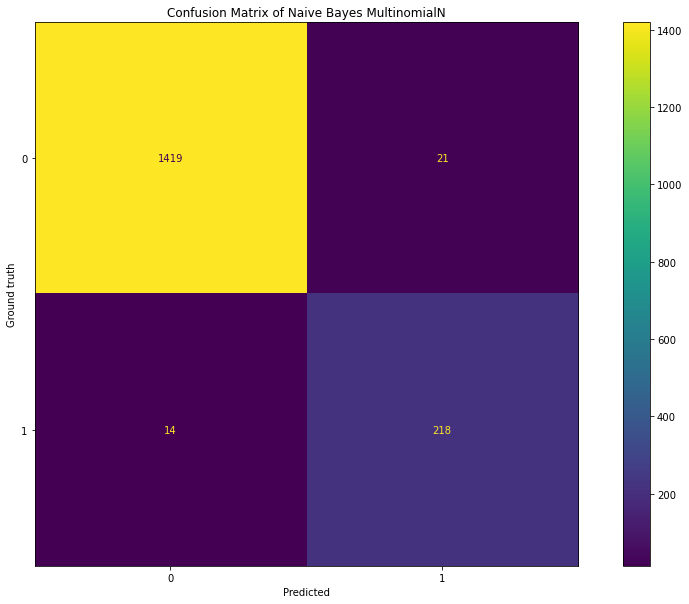

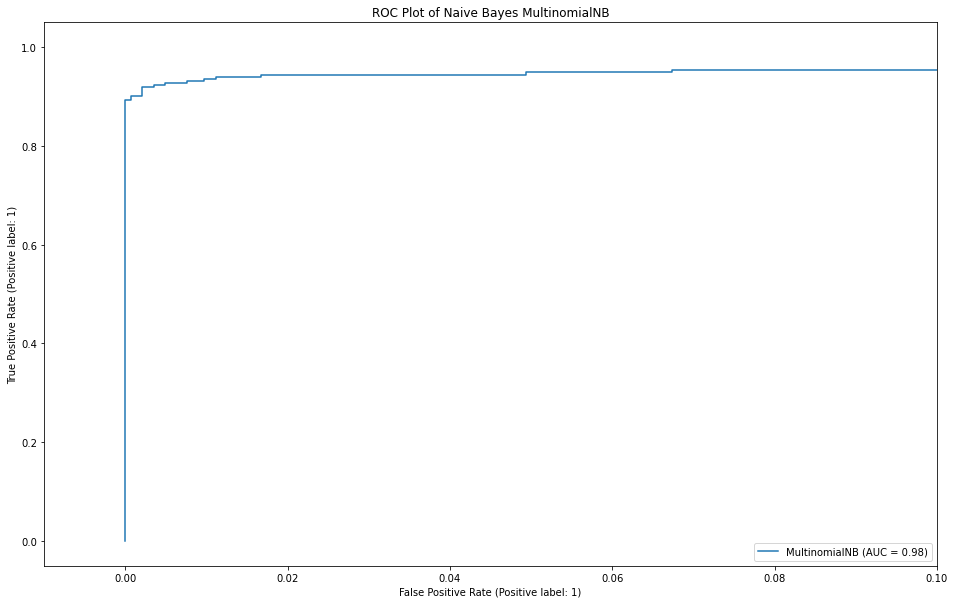

In [61]:
## Predict on test data
pred_nb_multi = nb_multi.predict(xtest)

## Display confusion metrics via @scikit learn
##       0    1
##     ---------
##  0 | TN | FP |
##     ---------
##  1 | FN | TP |
##     ---------

confusion = confusion_matrix(ytest, pred_nb_multi)
print("Confusion matrix: \n{}".format(confusion))

## Plot confusion matrix - ham = 0 and spam = 1
plot_confusion_matrix(nb_multi, xtest, ytest)  
plt.title('Confusion Matrix of Naive Bayes MultinomialN')
plt.xlabel('Predicted')
plt.ylabel('Ground truth')
plt.show()

## ROC Plot - Note from 0 - 10% FPR
plot_roc_curve(nb_multi, xtest, ytest)
plt.title('ROC Plot of Naive Bayes MultinomialNB')
plt.xlim([-0.01, 0.1])
plt.show()

In [62]:
## Specification of test parameters from confusion matrix
TN = confusion[0, 0]
TP = confusion[1, 1]
FP = confusion[0, 1]
FN = confusion[1, 0]

## Calculating metrics via test parameters manually
m_acc = (TP + TN)/ (TP + FN +TN + FP)
recall = TP / (TP + FN)
precision = TP / (TP + FP)
F1_score = (2 * precision * recall) / (precision + recall)
MCC = (TP * TN - FP * FN) / np.sqrt((TP +FP) * (TP + FN) * (TN + FP) * (TN + FN))

## Display calculated metrics manually
print("****** Calculated mectrics ****** ")
print("Calculated precision score:\t", precision)
print("Calculated recall score:\t", recall)
print("Calculated accuracy score:\t", m_acc)
print("Calculated f1 score:\t\t", F1_score)
print("Calculated MCC:\t\t\t", MCC)

## Display calculated metrics by sklearn
print("\n\n****** Verified mectrics ****** ")
print("Verified model precision score:\t",precision_score(ytest, pred_nb_multi))
print("Verified model recall score:\t",recall_score(ytest, pred_nb_multi))
print("Verified model accuracy score:\t",accuracy_score(ytest, pred_nb_multi))
print("Verified model f1 score:\t",f1_score(ytest, pred_nb_multi))
print("Verified model MCC:\t\t", matthews_corrcoef(ytest, pred_nb_multi))

****** Calculated mectrics ****** 
Calculated precision score:	 0.9121338912133892
Calculated recall score:	 0.9396551724137931
Calculated accuracy score:	 0.979066985645933
Calculated f1 score:		 0.9256900212314225
Calculated MCC:			 0.9136474643097822


****** Verified mectrics ****** 
Verified model precision score:	 0.9121338912133892
Verified model recall score:	 0.9396551724137931
Verified model accuracy score:	 0.979066985645933
Verified model f1 score:	 0.9256900212314225
Verified model MCC:		 0.9136474643097822


### Support Vector Machine 
SVC [1], NuSVC and LinearSVC are classes capable of performing binary and multi-class classification on a dataset.
SVC and NuSVC are similar methods, but accept slightly different sets of parameters and have different mathematical formulations. 
SVC is used for developing SMS Spam Classifier

---
for more information see

a) https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC

b) https://scikit-learn.org/stable/modules/svm.html

[1] References: Platt, John (1999). “Probabilistic outputs for support vector machines and comparison to regularizedlikelihood methods.”

In [63]:
svm_svc = svm.SVC(random_state=0) # SVC and NuSVC use a random number generator only to shuffle the data for probability estimation (when probability is set to True).
svm_svc.fit(xtrain, ytrain)
print("Training set acc score: {:.4f}".format(nb_multi.score(xtrain, ytrain)))
print("Test set acc score: {:.4f}".format(nb_multi.score(xtest, ytest)))

Training set acc score: 0.9946
Test set acc score: 0.9791


Confusion matrix: 
[[1438    2]
 [  35  197]]


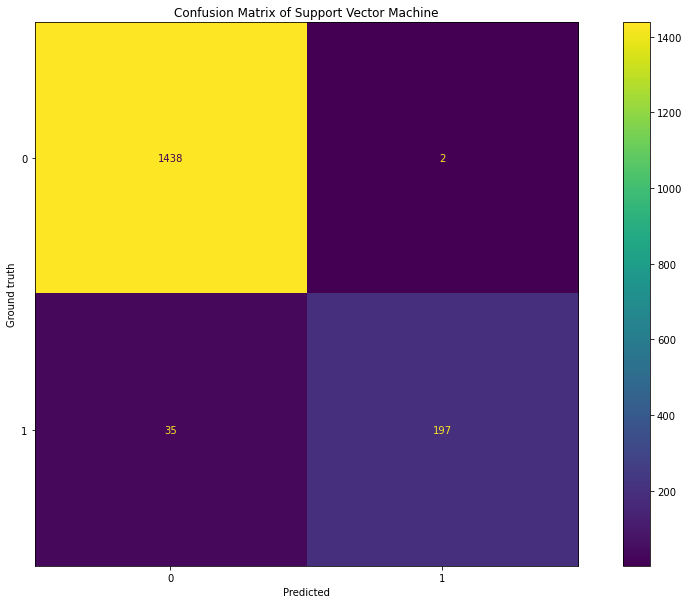

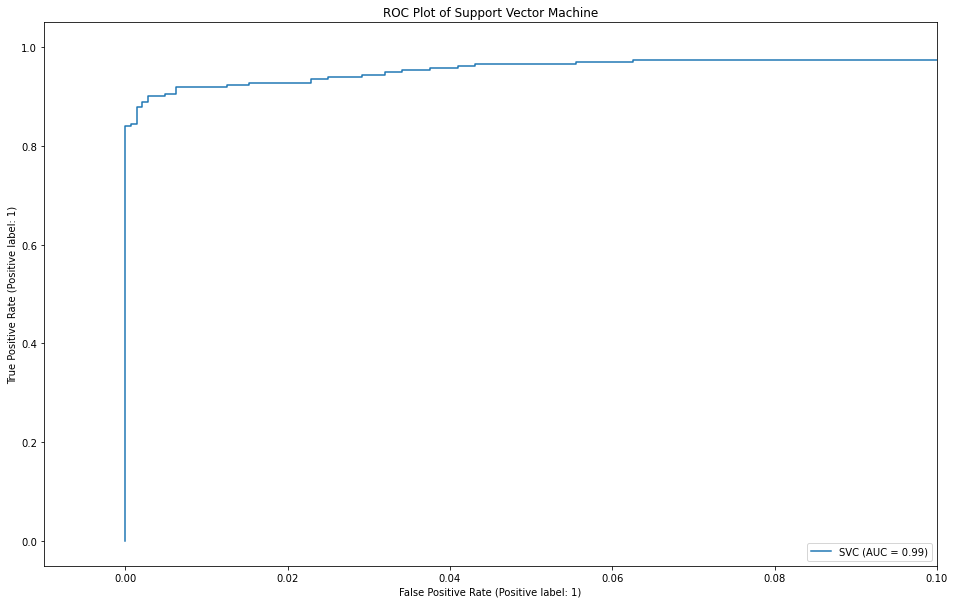

In [64]:
## Predict on test data
pred_svm_svc = svm_svc.predict(xtest)

## Display confusion metrics via @scikit learn
##       0    1
##     ---------
##  0 | TN | FP |
##     ---------
##  1 | FN | TP |
##     ---------

confusion = confusion_matrix(ytest, pred_svm_svc)
print("Confusion matrix: \n{}".format(confusion))

## Plot confusion matrix - ham = 0 and spam = 1
plot_confusion_matrix(svm_svc, xtest, ytest)  
plt.title('Confusion Matrix of Support Vector Machine')
plt.xlabel('Predicted')
plt.ylabel('Ground truth')
plt.show()

## ROC Plot - Note from 0 - 10% FPR
plot_roc_curve(svm_svc, xtest, ytest)
plt.title('ROC Plot of Support Vector Machine')
plt.xlim([-0.01, 0.1])
plt.show()

In [65]:
## Specification of test parameters from confusion matrix
TN = confusion[0, 0]
TP = confusion[1, 1]
FP = confusion[0, 1]
FN = confusion[1, 0]

## Calculating metrics via test parameters manually
m_acc = (TP + TN)/ (TP + FN +TN + FP)
recall = TP / (TP + FN) #TPR
precision = TP / (TP + FP)
F1_score = (2 * precision * recall) / (precision + recall)
MCC = (TP * TN - FP * FN) / np.sqrt((TP +FP) * (TP + FN) * (TN + FP) * (TN + FN))

## Display calculated metrics manually
print("****** Calculated mectrics ****** ")
print("Calculated precision score:\t", precision)
print("Calculated recall score:\t", recall)
print("Calculated accuracy score:\t", m_acc)
print("Calculated f1 score:\t\t", F1_score)
print("Calculated MCC:\t\t\t", MCC)

## Display calculated metrics by sklearn
print("\n\n****** Verified mectrics ****** ")
print("Verified model precision score:\t",precision_score(ytest, pred_svm_svc))
print("Verified model recall score:\t",recall_score(ytest, pred_svm_svc))
print("Verified model accuracy score:\t",accuracy_score(ytest, pred_svm_svc))
print("Verified model f1 score:\t",f1_score(ytest, pred_svm_svc))
print("Verified model MCC:\t\t", matthews_corrcoef(ytest, pred_svm_svc))

****** Calculated mectrics ****** 
Calculated precision score:	 0.9899497487437185
Calculated recall score:	 0.8491379310344828
Calculated accuracy score:	 0.9778708133971292
Calculated f1 score:		 0.91415313225058
Calculated MCC:			 0.9050334575194663


****** Verified mectrics ****** 
Verified model precision score:	 0.9899497487437185
Verified model recall score:	 0.8491379310344828
Verified model accuracy score:	 0.9778708133971292
Verified model f1 score:	 0.91415313225058
Verified model MCC:		 0.9050334575194663


### Random Forest 

- Random forests (RF) consist of multiple decision trees.

- Compared to decision trees, RF prevents overfitting by creating trees on random subsets.


---
For more information see https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

Confusion matrix: 
[[1440    0]
 [  44  188]]


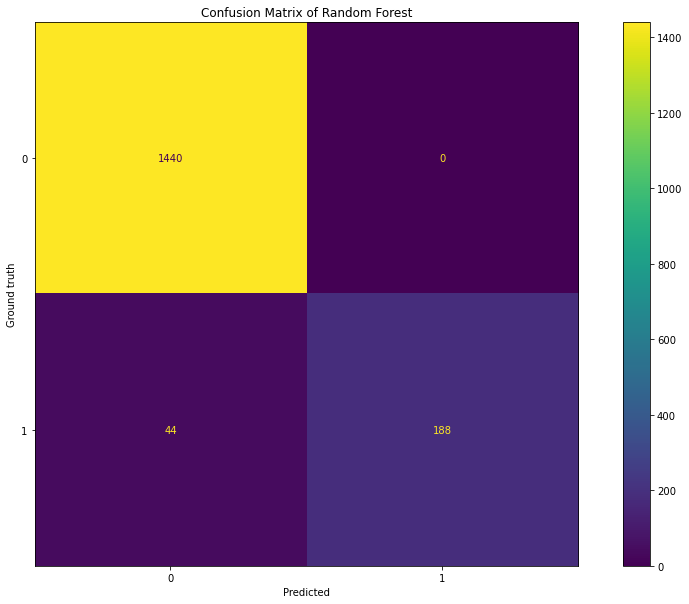

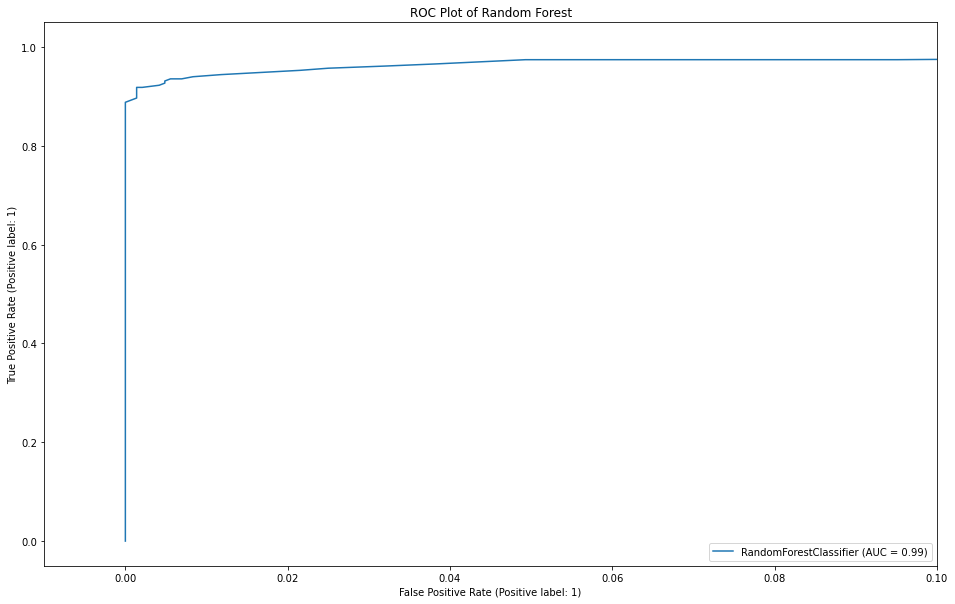

In [66]:
#Create a Gaussian Classifier
rfc = RandomForestClassifier(n_estimators=64, random_state=42)

#Train the model using the training set
rfc.fit(xtrain,ytrain)

#Test the model using the test set
pred_rfc = rfc.predict(xtest)

## Display confusion matrix via @scikit learn
##       0    1
##     ---------
##  0 | TN | FP |
##     ---------
##  1 | FN | TP |
##     ---------

confusion = confusion_matrix(ytest, pred_rfc)
print("Confusion matrix: \n{}".format(confusion))

## Plot confusion matrix - ham = 0 and spam = 1
plot_confusion_matrix(rfc, xtest, ytest)  
plt.title('Confusion Matrix of Random Forest')
plt.xlabel('Predicted')
plt.ylabel('Ground truth')
plt.show()

## ROC Plot - Note from 0 - 10% FPR
rfc_disp=plot_roc_curve(rfc, xtest, ytest)
plt.title('ROC Plot of Random Forest')
plt.xlim([-0.01, 0.1])
plt.show()

# Comparing models

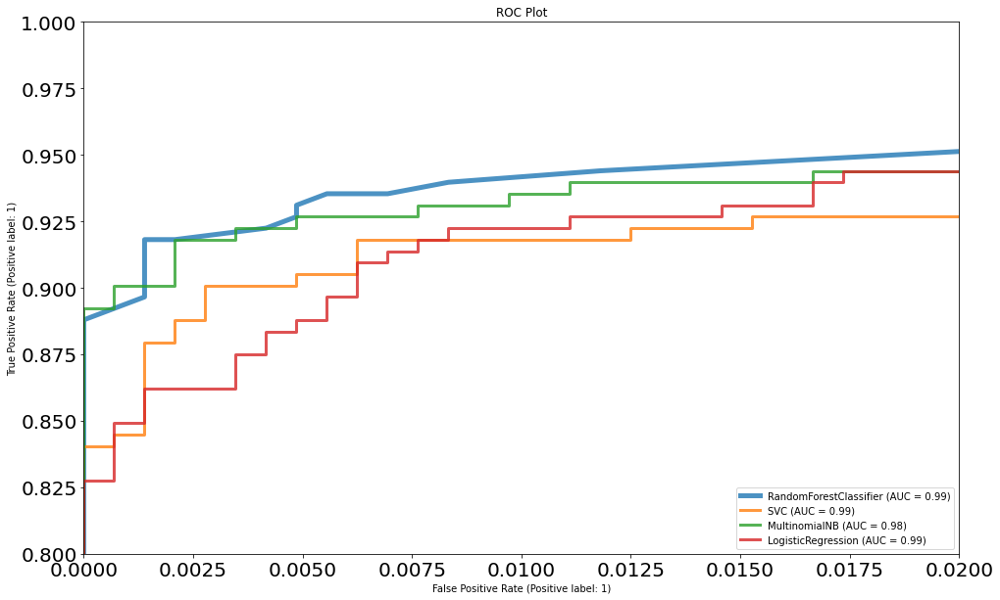

In [67]:
## All in one plot

ax = plt.gca()
rfc_disp = plot_roc_curve(rfc, xtest, ytest, ax=ax, alpha=0.8, linewidth=5)
svm_svc_disp = plot_roc_curve(svm_svc, xtest, ytest, ax=ax, alpha=0.8, linewidth=3)
nb_multi_disp = plot_roc_curve(nb_multi, xtest, ytest, ax=ax, alpha=0.8, linewidth=3)
logreg_disp=plot_roc_curve(logreg, xtest, ytest, ax=ax, alpha=0.8, linewidth=3)

plt.title("ROC Plot")
ax.xaxis.set_tick_params(labelsize=20)
ax.yaxis.set_tick_params(labelsize=20)
plt.rc('legend',fontsize=20) # using a size in points
plt.rc('legend',fontsize='medium') # using a named size
plt.xlim([0.0, 0.02])
plt.ylim([0.8, 1])
plt.show()

In [68]:
## Model optimization with best model - Random Forest


for i in range(20,100,5):
    threshold = i/100
    pred_rfc = (rfc.predict_proba(xtest)[:, 1] > threshold).astype('float')
    confusion_matrix(ytest, pred_rfc)
    print("Confusion matrix with threshold", threshold )
    print(confusion_matrix(ytest, pred_rfc))

Confusion matrix with threshold 0.2
[[1430   10]
 [  15  217]]
Confusion matrix with threshold 0.25
[[1434    6]
 [  18  214]]
Confusion matrix with threshold 0.3
[[1438    2]
 [  21  211]]
Confusion matrix with threshold 0.35
[[1440    0]
 [  26  206]]
Confusion matrix with threshold 0.4
[[1440    0]
 [  33  199]]
Confusion matrix with threshold 0.45
[[1440    0]
 [  36  196]]
Confusion matrix with threshold 0.5
[[1440    0]
 [  44  188]]
Confusion matrix with threshold 0.55
[[1440    0]
 [  54  178]]
Confusion matrix with threshold 0.6
[[1440    0]
 [  63  169]]
Confusion matrix with threshold 0.65
[[1440    0]
 [  70  162]]
Confusion matrix with threshold 0.7
[[1440    0]
 [  81  151]]
Confusion matrix with threshold 0.75
[[1440    0]
 [ 101  131]]
Confusion matrix with threshold 0.8
[[1440    0]
 [ 110  122]]
Confusion matrix with threshold 0.85
[[1440    0]
 [ 133   99]]
Confusion matrix with threshold 0.9
[[1440    0]
 [ 150   82]]
Confusion matrix with threshold 0.95
[[1440    0